<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [85]:
%matplotlib inline
import re
import pickle
import random

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
from sklearn.linear_model import ElasticNet
import phik
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer


random.seed(42)
np.random.seed(42)

### **Задание 0**
Для чего фиксируем сиды в домашках?

`Your answer here`

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [86]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape:", df_test.shape)

Train data shape: (6999, 13)
Test data shape: (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

#### Количество пропусков

In [87]:
na_train = df_train.isna().sum()
na_train[na_train != 0].reset_index().rename(
    columns={'index': 'Название столбца', 0: 'Количество пропусков'}
    )

,Название столбца,Количество пропусков
0,mileage,202
1,engine,202
2,max_power,196
3,torque,203
4,seats,202


In [88]:
na_test = df_test.isna().sum()
na_test[na_test != 0].reset_index().rename(
    columns={'index': 'Название столбца', 0: 'Количество пропусков'}
    )

,Название столбца,Количество пропусков
0,mileage,19
1,engine,19
2,max_power,19
3,torque,19
4,seats,19


#### Количество явных дубликатов

In [89]:
print(f'Количество явных дубликатов в тренировочной выборке: \
      {df_train.duplicated(keep="first").sum()}')
print(f'Количество явных дубликатов в тестовой выборке: \
      {df_test.duplicated(keep="first").sum()}')

df_train.drop_duplicates(keep='first', inplace=True)

Количество явных дубликатов в тренировочной выборке:       985
Количество явных дубликатов в тестовой выборке:       62


Если мы пройдемся по нашему датасету строчка за строчкой, то ранее уже встречавшиеся наблюдения, мы будем отмечать как дубликаты. А в отчете `ydata-profiling` выводится не количество дубликатов, а количество уникальных наблюдений которые имеют хотя бы одно повторение.

#### Дашборд ydata-profiling

In [90]:
ProfileReport(df_train, title='Отчет по тренировочной выборке')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [91]:
ProfileReport(df_test, title='Отчет по тестовой выборке')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Вывод по дашбордам

Мы можем заметить, что распределение переменных в тренировочном множестве и тестовом немного отличается. В тренировочном сете мы имеем более выраженные всплески машин 2010 и 2014 годов выпуска. В тренировочной выборке максимальная стоимость автомобиля выше практически в два раза, а максимальный пробег отличается еще сильнее. Доля авто с одним владельцем в тренировочном множестве немного выше. Возможно следует объеденить данные и разделить их заново, а также как то разобраться с выбросами.

Столбцы с данными о расходе топлива, объеме двигателя, максимальной мощности и крутящем моменте приведены к текстовому формату, стоит их привести к числовому формату либо категоризировать.

Сильнее всего коррелирует с целевой переменной - `transmission`, `year`. Наблюдается сильная корреляция между `year` и `km_driven`

Пропущенные значения в одном из столбце чаще всего совпадает с пропусками в других, возможно стоит избавиться от этих наблюдений.

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

#### Основные статистики для числовых переменных

In [92]:
# your code here
df_train.describe(include=np.number)

,year,selling_price,km_driven,seats
count,6014.000000,6.014000e+03,6.014000e+03,5824.000000
mean,2013.447456,5.219820e+05,7.376415e+04,5.437672
std,4.079920,5.338426e+05,5.961075e+04,0.991755
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,5.000000
50%,2014.000000,4.099990e+05,7.000000e+04,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [93]:
df_test.describe(include=np.number)

,year,selling_price,km_driven,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,5.410805
std,4.012149,7.585539e+05,48486.218662,0.919985
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


Выбросы сильнее влияют на среднее чем на медиану, если среднее смещено по отношению к медиане, это нам говорит о более тяжелом хвосте с этой стороны. Мы можем заметить, что у нас сильно смещено среднее вправо в столбце с информацией о пробеге и о цене автомобиля, это может свидетельствовать о тяжелом хвосте распределения с правой стороны. Обратите внимание, что среднее и медиана в этих переменных в тестовой выборке немного смещена относительно тренировочной выборки. Это может говорить о небольшом различии в распределениях.

#### Основные статистики для строковых переменных

In [94]:
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6014,6014,6014,6014,6014,5824,5824,5827,5823
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,107,3269,5394,5505,3721,184,795,282,417


In [95]:
df_test.describe(include='object')

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,1000,1000,1000,1000,1000,981,981,981,981
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,43,57


Как мы уже замечали выше, столбцы - `mileage`, `engine`, `max_power`, `torque` стоит обработать и привести к числовым типам, либо разбить на категории. Переменная `name` имеет огромное количество уникальных значений, ее наверное нужно разбить на категории.

### **Задание 3 (0.2 балла)**

На прошлом шаге вы убедились, что явных дубликатов в таблице нет. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [ ] Отобразите такие объекты (0.05 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

Так как в этом задании написано, что мы убедились, что дублей нет принимаю решение удалить их из выборки на прошлом шаге. Товарищи ревьюверы не судите строго.

#### Неявные дубликаты

In [96]:
# определяем сисок переменных, исключая целевую переменную
features = df_train.columns.drop('selling_price').to_list()

print(f'Количество наблюдений в тесте с одинаковым признаковым описанием - \
      {df_train[features].duplicated(keep="first").sum()}')

# выводим первые 20 строк с одинаковыми признаковыми описаниями
df_train[df_train.duplicated(subset=features, keep=False)].sort_values(by=['name', 'year'])[:20]

Количество наблюдений в тесте с одинаковым признаковым описанием -       174


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
124,BMW X4 M Sport X xDrive20d,2019,5800000,7500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
370,BMW X4 M Sport X xDrive20d,2019,5400000,7500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
447,Chevrolet Beat Diesel LT,2012,220000,70000,Diesel,Individual,Manual,Second Owner,25.44 kmpl,936 CC,57.6 bhp,150Nm@ 1750rpm,5.0
766,Chevrolet Beat Diesel LT,2012,200000,70000,Diesel,Individual,Manual,Second Owner,25.44 kmpl,936 CC,57.6 bhp,150Nm@ 1750rpm,5.0
4704,Chevrolet Beat Diesel LT,2012,165000,70000,Diesel,Individual,Manual,Second Owner,25.44 kmpl,936 CC,57.6 bhp,150Nm@ 1750rpm,5.0
5503,Chevrolet Enjoy 1.3 TCDi LS 8,2016,490000,80000,Diesel,Individual,Manual,First Owner,18.2 kmpl,1248 CC,73.74 bhp,172.5Nm@ 1750rpm,8.0
6599,Chevrolet Enjoy 1.3 TCDi LS 8,2016,525000,80000,Diesel,Individual,Manual,First Owner,18.2 kmpl,1248 CC,73.74 bhp,172.5Nm@ 1750rpm,8.0
6946,Chevrolet Spark 1.0 LS,2010,114999,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
2839,Datsun RediGO 1.0 T Option,2017,300000,20000,Petrol,Individual,Manual,First Owner,22.5 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0


In [97]:
df_train.drop_duplicates(subset=features, inplace=True, keep='first')
df_train.reset_index(drop=True, inplace=True)

In [98]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

#### Убираем единицы измерения

In [99]:
def calc_num_column(value):
    if value is np.nan:
        return np.nan
    value = value.split()[0]
    try:
        value = float(value)
    except:
        print(f"Значение - {value} заменено на NaN")
        value = np.nan 
    finally:
        return value

In [100]:
df_train['mileage'] = df_train['mileage'].map(calc_num_column)
df_test['mileage'] = df_test['mileage'].map(calc_num_column)

In [101]:
df_train['engine'] = df_train['engine'].map(calc_num_column)
df_test['engine'] = df_test['engine'].map(calc_num_column)

In [102]:
df_train['max_power'] = df_train['max_power'].map(calc_num_column)
df_test['max_power'] = df_test['max_power'].map(calc_num_column)

Значение - bhp заменено на NaN


In [103]:
def torque_rpm(value):
    if value is np.nan:
        return (np.nan, np.nan)
    value = value.replace(',', '')
    nums = re.findall(r'\d+(?:\.\d+)?', value)
    value_nm = nums[0]
    value_rpm = nums[-1]
    nm = re.search(r'(Nm)|(kgm)', value, flags=re.IGNORECASE)

    if nm and nm[0] == 'kgm':
        value_nm = float(value_nm) * 9.81
    
    return value_nm, value_rpm

In [104]:
df_train['torque'] = df_train.torque.map(torque_rpm)
df_test['torque'] = df_test.torque.map(torque_rpm)

In [105]:
df_train = df_train.assign(
    torque=df_train['torque'].apply(lambda x: x[0]).astype(float),
    max_torque_rpm=df_train['torque'].apply(lambda x: x[1]).astype(float),
)

df_test = df_test.assign(
    torque=df_test['torque'].apply(lambda x: x[0]).astype(float),
    max_torque_rpm=df_test['torque'].apply(lambda x: x[1]).astype(float),
)

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`

In [106]:
# создадим переменных в которых будем хранить названия столбцов с числовыми данными
num_features = df_train.select_dtypes(include='number').columns.to_list()

# посчитаем медиану на трейне для каждого столбца с числовыми данными
median = df_train[num_features].median()

# заполним пропуски медианой
df_train = df_train.fillna(value=median)
df_test = df_test.fillna(value=median)

# проверим остались ли у нас пропуски
print(f'Количество пропусков в трейне - {df_train.isna().sum().sum()}')
print(f'Количество пропусков в тесте - {df_test.isna().sum().sum()}')

Количество пропусков в трейне - 0
Количество пропусков в тесте - 0


#### Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.

Медиана гораздо менее чувствительна к выбросам в данных, поэтому если распределение не симметричное медиана лучше отражает типичное значение и лучше сохранит распределение. К тому же если мы применим среднее для заполнения пропущенных значений, появление в данных выбросов может достаточно сильно изменить среднее и так наша модель будет менее стабильная. Среднее можно применять, но в тех случаях где мы имеем симметричное распределение, впрочем в таком распределении среднее будет совпадать с медианой.

#### Как правильно считать медиану для заполнения? Выберите верное утверждение:

Конечно правильным будет считать медиану по тестовой выборке, и заполнять пропуски в трейне и в тесте одними значениями. Когда мы будем использовать нашу модель в проде мы же будем заполнять пропуски медианой на исторических данных. Расчет медианы по всем данным будет тоже плохой идеей, в этом случае будет иметь место утечка данных - данные из теста просочатся в трейн.

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [107]:
df_train[['engine', 'seats']] = df_train[['engine', 'seats']].astype(int)
df_test[['engine', 'seats']] = df_test[['engine', 'seats']].astype(int)

#### Почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

Столбец ``seats`` принимает конечное число значений, в частности в тренировочной выборке в этом столбце содержится только 9 уникальных значений, поэтому мы могли бы рассматривать ``seats`` как категориальную переменную.

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [108]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,174.991860,5.426712,3038.631507
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,107.339548,0.982344,918.277038
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,14.900000,2.000000,400.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,111.800000,5.000000,2250.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,160.000000,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,200.031000,5.000000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,1863.900000,14.000000,21800.000000


In [109]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.00000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.33881,1454.87600,90.841670,177.410394,5.403000,3078.456000
std,4.012149,7.585539e+05,48486.218662,3.95175,521.99574,34.893389,103.843448,0.912921,903.502756
min,1995.000000,3.100000e+04,1303.000000,0.00000,624.00000,34.200000,24.000000,4.000000,400.000000
25%,2011.000000,2.500000e+05,37000.000000,16.55000,1197.00000,69.000000,111.700000,5.000000,2500.000000
50%,2014.000000,4.349990e+05,61500.000000,19.37000,1248.00000,82.425000,160.000000,5.000000,3000.000000
75%,2017.000000,6.700000e+05,100000.000000,22.30000,1582.00000,102.000000,205.000000,5.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,32.26000,3604.00000,280.000000,1422.450000,9.000000,5200.000000


In [110]:
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [111]:
df_test.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


#### Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

Так как мы заполняли пропуски медианой, и у нас совсем небольшое количество пропусков, то заполнение не может как то серьезно повлиять на распределения переменных. А вот если пропусков будет огромное количество, то наше распределение станет более узким и например такие показатели как дисперсия снизятся.

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

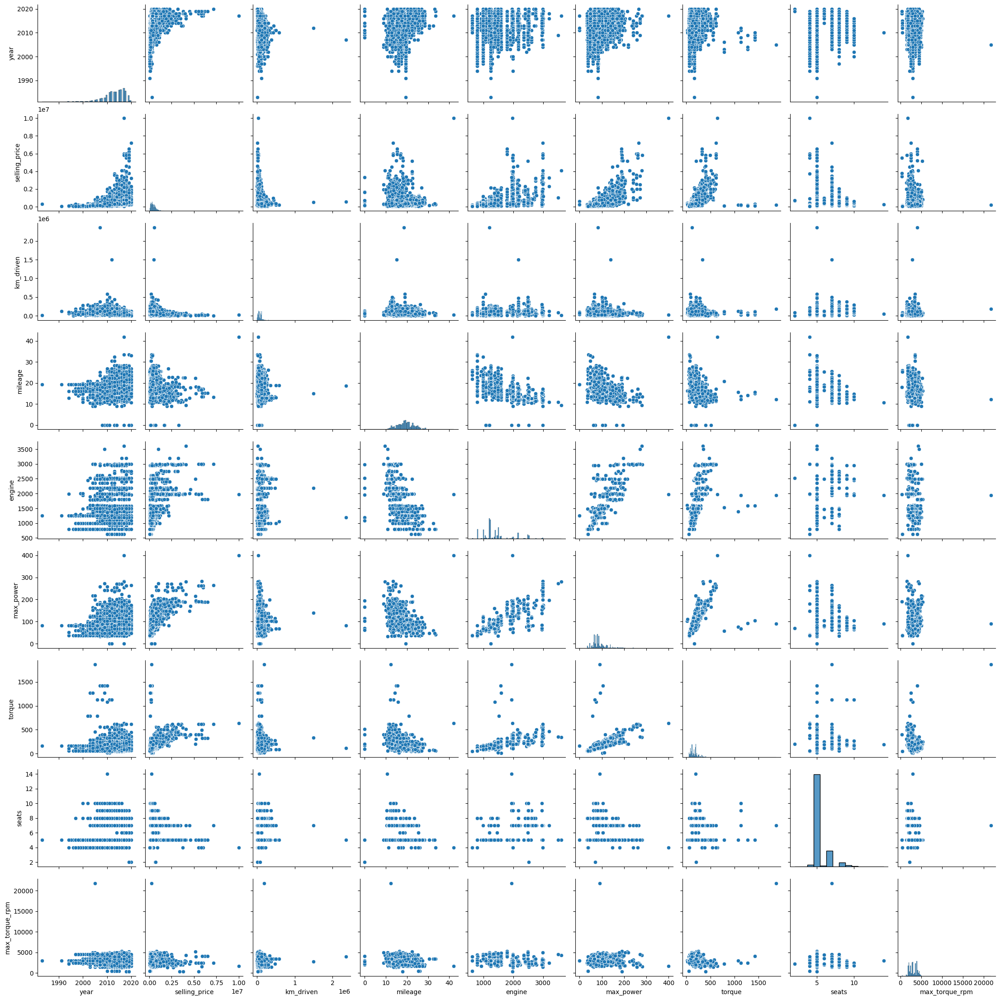

In [112]:
sns.pairplot(data=df_train)

#### Можно ли предположить на основе распределений связь признаков с целевой переменной?

На основе распределений, мы можем только выдвинуть гипотезу о связи переменных. Потому что даже очень четкая зависимость на графике, может быть результатом зависимости этих переменных от третьей, в реальности.

#### Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Конечно выдвинуть гипотезу о корреляции признаков можно, потому что даже если признаки зависят от какой-то третьей переменной они будут коррелировать между собой. Но корреляция не говорит нам о связи.

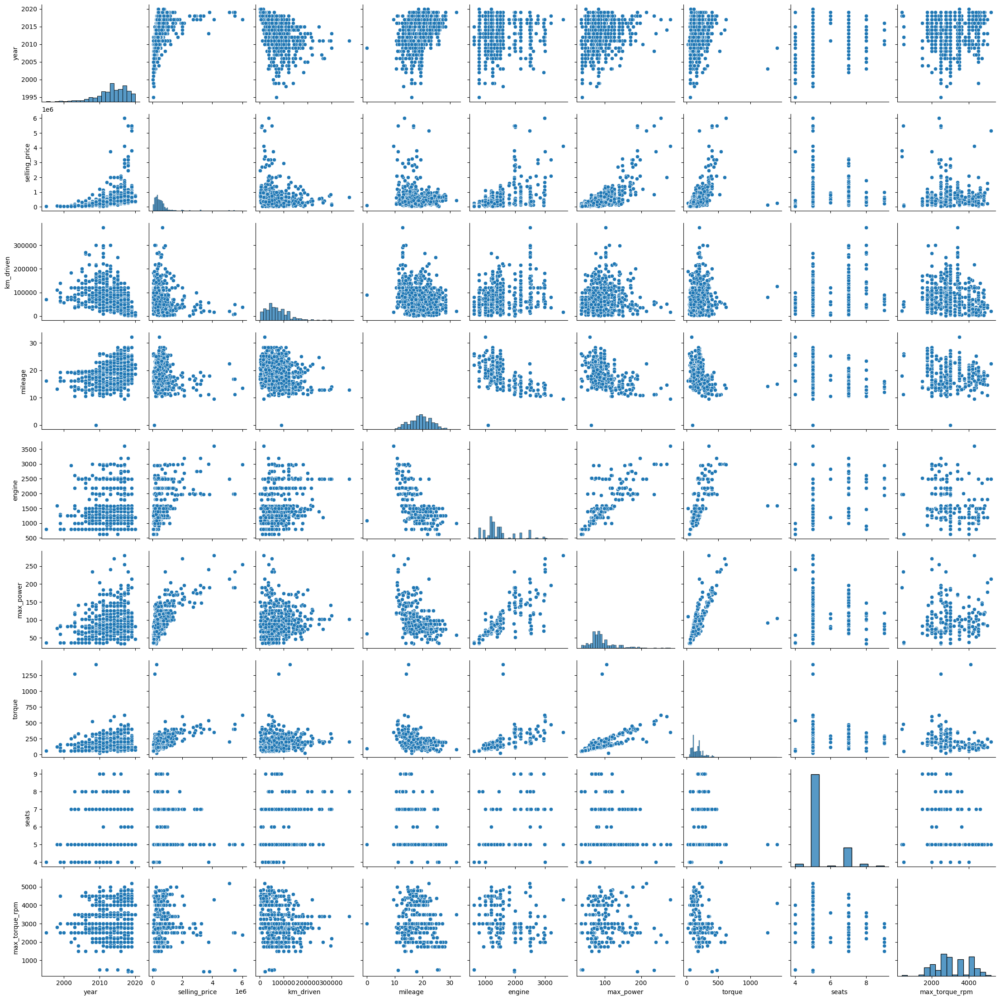

In [113]:
sns.pairplot(data=df_test)

#### Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

Все совокупности в целом оказались похожими, за исключением того, что в трейне встречаются выбросы больше, чем в тесте, но это и логично, потому что данных в трэйне больше в семь раз.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

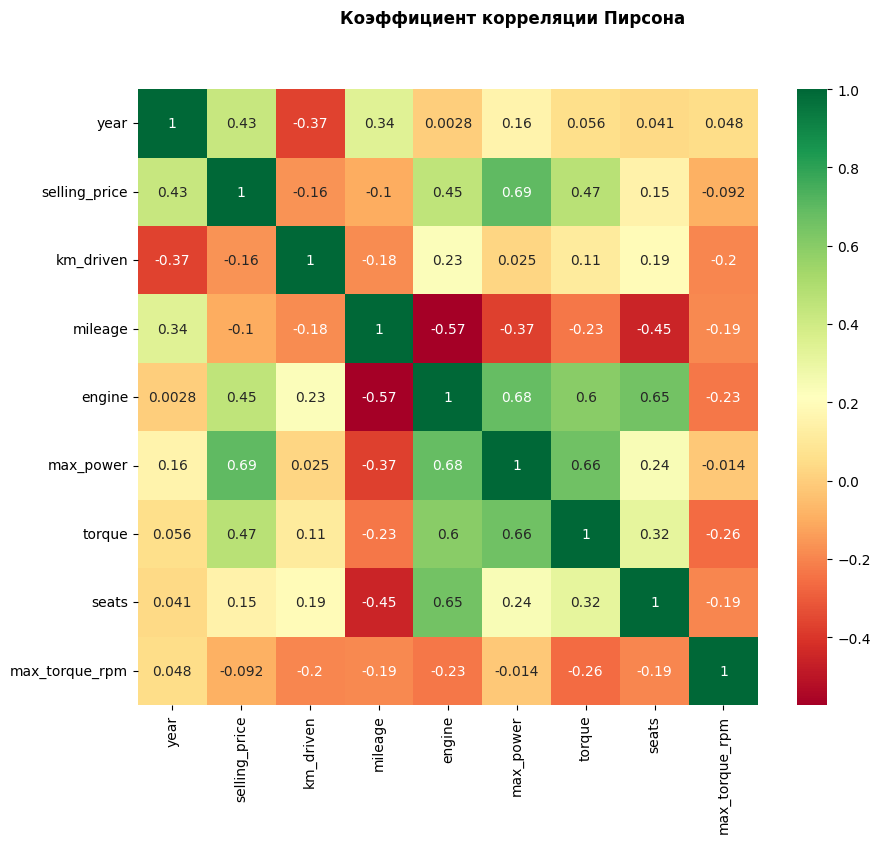

In [114]:
plt.figure(figsize=(10, 8))
sns.heatmap(df_train[num_features].corr(), annot=True, cmap='RdYlGn')
plt.suptitle('Коэффициент корреляции Пирсона', weight='bold')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

#### Какие 2 признака наименее скоррелированы между собой?

`engine` и `year`.

#### Между какими наблюдается довольно сильная положительная линейная зависимость?

Довольно сильная положительная корреляция между `max_power` и `selling_price`, `max_power` и `engine`, `seats` и `engine`, `engine` и `selling_price`.

#### Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

Да мы можем так утверждать, потому что корреляция между этими переменными отрицательная.


### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ]

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


#### Корреляция Пирсона

In [115]:
def rank_columns(matrix):
    """
        Функция для вычисления рангов значений каждого признака
    """
    num_rows, num_cols = matrix.shape
    ranks = np.zeros_like(matrix, dtype=float)
    
    for col in range(num_cols):
        sorted_indices = np.argsort(matrix[:, col])
        ranks_col = np.zeros(num_rows)
        ranks_col[sorted_indices] = np.arange(1, num_rows + 1)
        
        # Присвоение среднего ранга одинаковым значениям признака
        unique_values = np.unique(matrix[:, col])
        for value in unique_values:
            same_value_indices = np.where(matrix[:, col] == value)[0]
            if len(same_value_indices) > 1:
                average_rank = np.mean(ranks_col[same_value_indices])
                ranks_col[same_value_indices] = average_rank
        
        ranks[:, col] = ranks_col
    
    return ranks

In [116]:
# посчитаем ранги и проверим правильность расчетов
ranks = rank_columns(df_train[num_features].values)
n = df_train.shape[0]

assert np.any(ranks.sum(axis=0) == (n + 1) / 2 * n)

Посчитаем корреляцию пирсона по формуле предложенной на лекции:

$$\rho = 1 - \frac{6 \cdot \sum d^2_i}{n(n^2 - 1)}$$

Я прочитал, что эта формула используется при отсутствии повторяющихся рангов [источник](https://statpsy.ru/spearman/correlation-srearman/), но это не наш случай. Все же расчитаем и посмотрим как будут различаться значения по сравнению с методом реализованным в pandas.

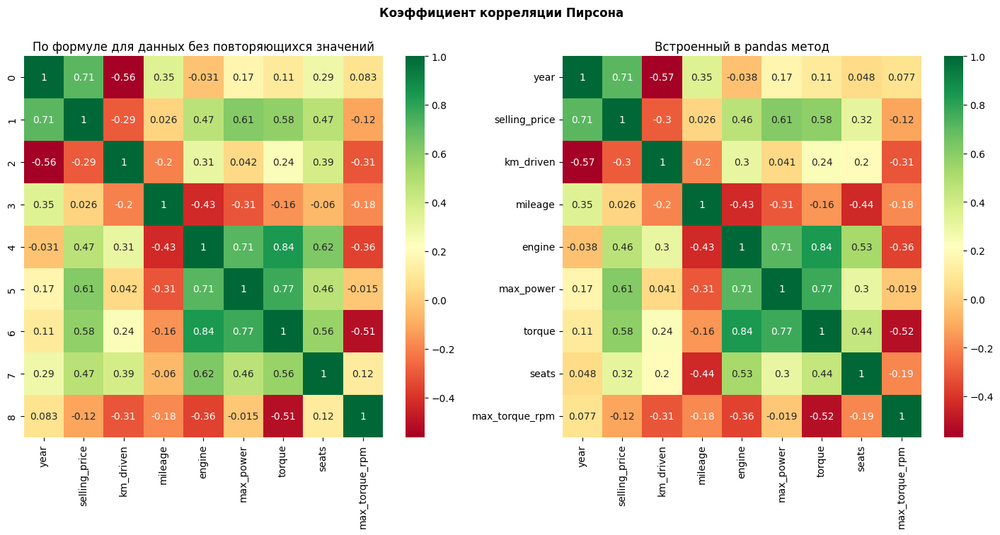

In [117]:
ranks = rank_columns(df_train[num_features].values)

n = df_train.shape[0]
diff = ranks.T[:, :, np.newaxis] - ranks[np.newaxis, :, :]
corr = pd.DataFrame(1 - 6 * np.power(diff, 2).sum(axis=1) / (n * (n ** 2 - 1)), columns=num_features)

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(18, 7))
sns.heatmap(corr, annot=True, cmap='RdYlGn', ax=ax[0])
sns.heatmap(df_train[num_features].corr(method='spearman'), annot=True, cmap='RdYlGn', ax=ax[1])
plt.suptitle('Коэффициент корреляции Пирсона', weight='bold')
ax[0].set_title('По формуле для данных без повторяющихся значений')
ax[1].set_title('Встроенный в pandas метод')
plt.show()

Мы видим, что в целом значения похожи, но есть и отличия довольно большие. Теперь расчитаем также как реализовано в pandas, посчитаем кореляцию пирсона по рангам.

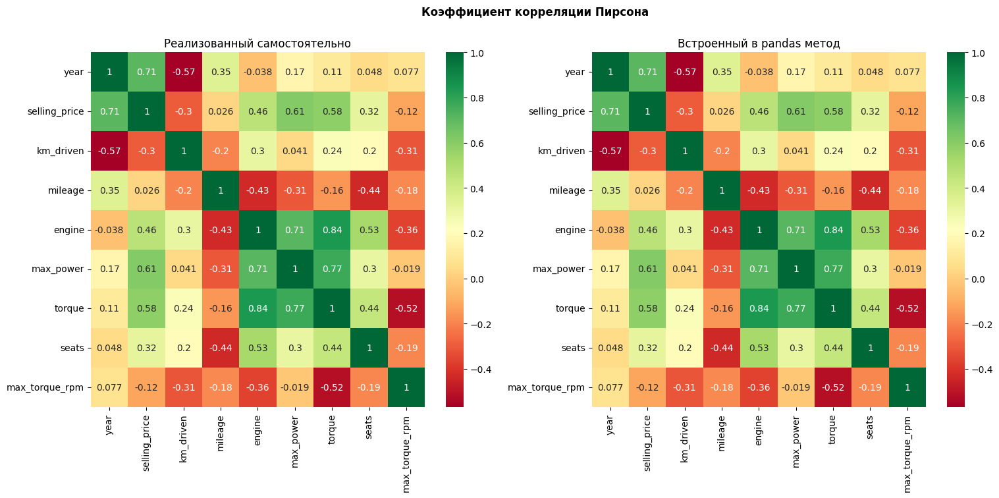

In [118]:
error = (ranks - ranks.mean(0))
numerator = (error.T[:, :, np.newaxis] * error[np.newaxis, :, :]).sum(1)
disp = np.power(error, 2).sum(0)
denominator = np.sqrt(disp[:, np.newaxis] * disp[np.newaxis, :])
corr = pd.DataFrame(numerator / denominator, columns=num_features, index=num_features)

fig, ax = plt.subplots(ncols=2, nrows=1, figsize=(18, 7))
sns.heatmap(corr, annot=True, cmap='RdYlGn', ax=ax[0])
sns.heatmap(df_train[num_features].corr(method='spearman'), annot=True, cmap='RdYlGn', ax=ax[1])
plt.suptitle('Коэффициент корреляции Пирсона', weight='bold')
ax[0].set_title('Реализованный самостоятельно')
ax[1].set_title('Встроенный в pandas метод')
plt.show()

Теперь видим, что значения корреляции полностью совпадают. 

/home/father/Yandex.Disk/ВШЭ/ML/hw/hw1/.venv/lib/python3.10/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


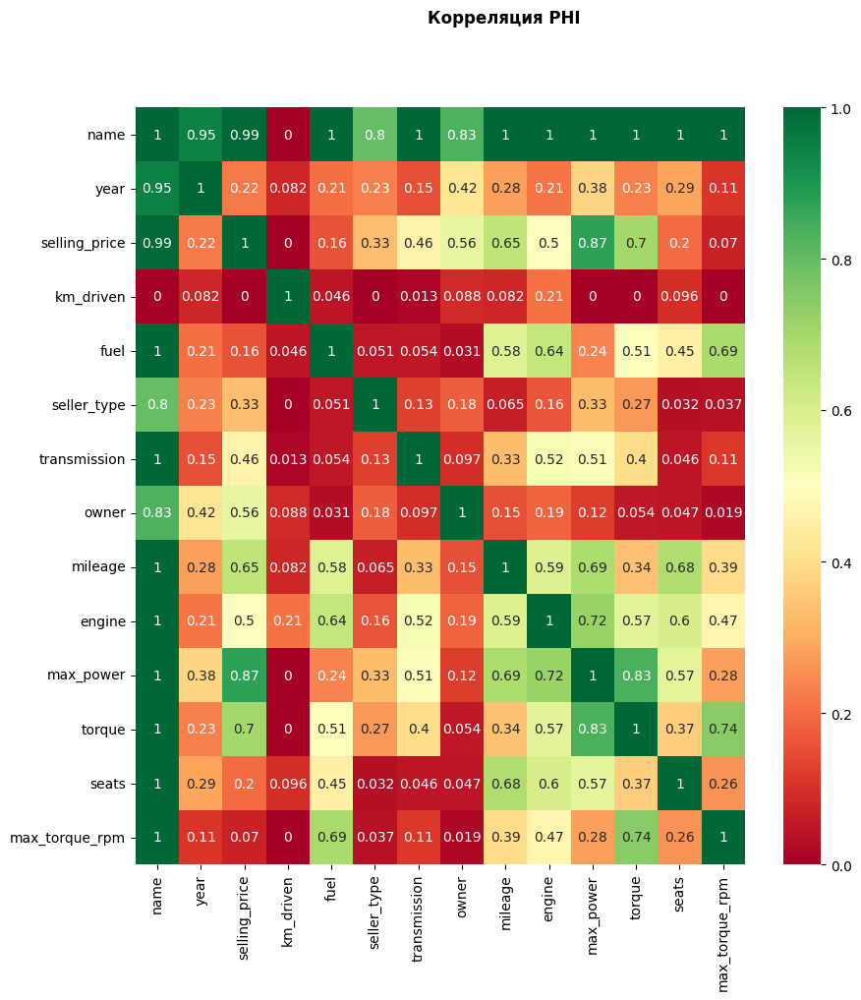

In [119]:
plt.figure(figsize=(10,10))
ph = df_train.phik_matrix(interval_cols=num_features)
sns.heatmap(ph, cmap="RdYlGn", annot=True)
plt.suptitle("Корреляция PHI", weight="bold")
plt.show()

Помощью корреляции PHI мы можем посмотреть кореляции всех переменных, незвависимо от того, категориальная она или вещественная. Мы видим, что с ыелевой переменной сильнее всего скоррелированы: 
- `max_power`, `torque`, `mileage` - мощная машина имеет высокий крутящий момент и большой расход, но соответственно и стоит дорого. В эту группу можно отнести и `engine`. Соответсвенно эти переменные коррелируют между собой.
- `owner` - с одним собственником состояние автомобиля чаще всего лучше, поэтому цена выше на такие машины.
- `transmission` - в настоящее время никто не хочет ездить на механике.

Мы можем заметить, что переменная `name` очень сильно коррелирует со всеми переменными, но это может быть, потому что эта переменная имеет огромное количество уникальных значений. Наверное стоит из названия автомобиля сделать марку, иначе у нас получится вектор наблюдения огромной размерности.

Сильной корреляции(выше 0,9) между признаками не наблюдаем.


### **Дополнительные визуализации (бонус 0.2 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

In [120]:
cat_features = list(set(features) - set(num_features))
cat_features.remove("name")
target = 'selling_price'

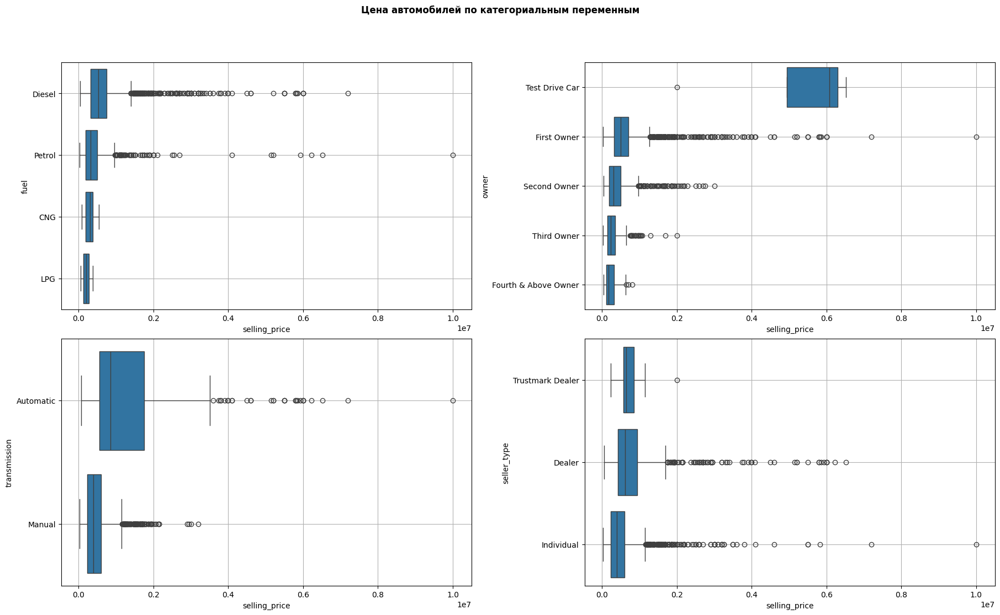

In [121]:
fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(18, 10), layout="constrained")
for i, col in enumerate(cat_features):
    order = df_train.groupby(col).selling_price.median().sort_values(ascending=False).index
    df_train.groupby(col)['name'].count()
    cnt = df_train.groupby(col)['name'].count()
    sns.boxplot(
        data=df_train, 
        x='selling_price', 
        y=col, 
        ax=axs[i // 2, i % 2],
        order=order
        )
    axs[i // 2, i % 2].grid()
plt.suptitle('Цена автомобилей по категориальным переменным', weight='bold', y=1.1)
plt.show()

Мы видим как распределена цена автомобилей в разрезе категорий. До этого мы знали, что вид трансмиссии скоррелирован с ценой, но в какую сторону менялась цена было непонятно. По графику можно например заметить, что автомобили с механикой, как правило стоят дешевле, а все машины стоимостью более 4 000 000 на автомате.

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [122]:
num_features.remove(target)
y_train = df_train[target]
X_train = df_train[num_features]

In [123]:
# в чате ответили, что assert перекочевал из base
# поэтому я изменил его, организаторы сказали так можно
# можно убедиться, что в X_train только числовые переменные
assert X_train.shape == (5840, 8)

In [124]:
y_test = df_test[target] # your code here
X_test = df_test[num_features] # your code here

In [125]:
assert X_test.shape == (1000, 8)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [126]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lr = LinearRegression()

lr.fit(X_train, y_train)

y_train_predict = lr.predict(X_train)
y_test_predict = lr.predict(X_test)

print(f'Train RMSE: {MSE(y_train, y_train_predict) ** 0.5}')
print(f'Test RMSE: {MSE(y_test, y_test_predict) ** 0.5}')
print(f'Train R2 score: {r2_score(y_train, y_train_predict)}')
print(f'Test R2 score: {r2_score(y_test, y_test_predict)}')

Train RMSE: 337446.56772356876
Test RMSE: 476137.35651762725
Train R2 score: 0.6027391635021175
Test R2 score: 0.6056097421607773


По значению метрики MSE сложно понять, насколько хороша наша модель, поэтому вывожу RMSE. RMSE на тесте у нас выше, чем медианная стоимость авто в нашей выборке, поэтому сложно назвать нашу модель хорошей. Если посмотреть на коэффициент детерминации,то он далек от 1 значит наша модель далеко не идеальная.

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [127]:
def coef_determ(y_true, y_pred):
    """Вычисляет коэффициент детерминации R^2"""
    diff_sqrt = np.power(y_pred - y_true, 2).sum()
    disp = np.power(y_true - y_true.mean(), 2).sum()
    return (1 - diff_sqrt / disp).item()

`diff_sqrt` - это сумма квадратов отклонений прогнозов нашей модели от реальных значений, чем меньше это значение тем лучше модель. Это значение напоминает MSE без усреднения.

disp - это сумма квадратов отклонений реальных значений от среднего значения, это нам напоминает дисперсию случайной величины, только без усреднения

Получается, что коэффицент детерминации показывает как относится квадрат ошибки нашей модели к дисперсии. Для идеальной модели это отношение будет равно 0, для модели где в качестве предсказания будет взято среднее
мы получим единицу. Ну когда мы результат этого отношения отнимем от 1, получим:

коэф.детерминации=1 - идеальная модель
коэф.детерминации=0 - наивная модель, где в качестве предсказания будет взято среднее

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [128]:
def adjusted_coef_determ(y_true, y_pred):
    n = y_true.size
    p = X_train.shape[1]
    r2 = coef_determ(y_true, y_pred)
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

#### Объясните, когда применяется $\text{adjusted}-R^2$?

Коэффициент детерминации при увеличении количества признаков при прочих равных будет увеличиваться, поэтому для сравнения моделей с разным количеством признаков используют исправленный коэффициент детерминации.

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [129]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr_sc = LinearRegression()

lr_sc.fit(X_train_scaled, y_train)

y_train_predict = lr_sc.predict(X_train_scaled)
y_test_predict = lr_sc.predict(X_test_scaled)

print(f'Train RMSE: {MSE(y_train, y_train_predict) ** 0.5}')
print(f'Test RMSE: {MSE(y_test, y_test_predict) ** 0.5}')
print(f'Train R2 score: {r2_score(y_train, y_train_predict)}')
print(f'Test R2 score: {r2_score(y_test, y_test_predict)}')

Train RMSE: 337446.56772356847
Test RMSE: 476137.3565176286
Train R2 score: 0.6027391635021183
Test R2 score: 0.6056097421607751


Ошибки практически не поменялись.

### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [130]:
num_features[np.abs(lr_sc.coef_).argmax()]

'max_power'

#### Какой признак оказался наиболее информативным в предсказании цены?

Для линейной модели наиболее важным признаком для предсказания цены оказался `max_power`, он также показывал самую высокую корреляцию.


### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [131]:
from sklearn.linear_model import Lasso

lasso = Lasso()

lasso.fit(X_train_scaled, y_train)

y_train_predict = lasso.predict(X_train_scaled)
y_test_predict = lasso.predict(X_test_scaled)

print(f'Train RMSE: {MSE(y_train, y_train_predict) ** 0.5}')
print(f'Test RMSE: {MSE(y_test, y_test_predict) ** 0.5}')
print(f'Train R2 score: {r2_score(y_train, y_train_predict)}')
print(f'Test R2 score: {r2_score(y_test, y_test_predict)}')

Train RMSE: 337446.5677436512
Test RMSE: 476138.2005315118
Train R2 score: 0.6027391634548331
Test R2 score: 0.6056083439459805


In [132]:
lasso.coef_

array([166786.70414622, -49064.90292564, -11726.348214  ,  19244.45454626,
       328949.59589153,   9273.01878791, -30608.17314901, -63547.43198377])

Веса нашей модели не занулились, возможно каждый из наших признаков достаточно важен для нашей модели и нет сильно скоррелированных признаков.

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [133]:
from sklearn.model_selection import GridSearchCV

# Определение модели Lasso
lasso_gs = Lasso()

# Определение сетки гиперпараметров для поиска
param_grid = {
    'alpha': np.logspace(-4, 1, 30),  # Параметр регуляризации
}
# Настройка GridSearchCV
grid_search = GridSearchCV(
    estimator=lasso_gs, 
    param_grid=param_grid, 
    cv=10, 
    scoring='r2',
    verbose=1, 
    n_jobs=-1
    )

# Обучение модели
grid_search.fit(X_train_scaled, y_train)

# Лучшие параметры
print("Лучшие параметры:", grid_search.best_params_)

# Оценка на тестовой выборке
best_model_lasso = grid_search.best_estimator_

y_train_predict = best_model_lasso.predict(X_train_scaled)
y_test_predict = best_model_lasso.predict(X_test_scaled)

print(f'Train RMSE: {MSE(y_train, y_train_predict) ** 0.5}')
print(f'Test RMSE: {MSE(y_test, y_test_predict) ** 0.5}')
print(f'Train R2 score: {r2_score(y_train, y_train_predict)}')
print(f'Test R2 score: {r2_score(y_test, y_test_predict)}')

Fitting 10 folds for each of 30 candidates, totalling 300 fits
Лучшие параметры: {'alpha': np.float64(10.0)}
Train RMSE: 337446.5697624135
Test RMSE: 476145.8212642363
Train R2 score: 0.6027391587016351
Test R2 score: 0.6055957191347447


#### Сколько грид-сёрчу пришлось обучать моделей?

30 * 10 = 300

#### Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`?

`alpha` - коэффициент регуляризации, чем больше этот коэффициент, тем сильнее регуляризация.

In [134]:
best_model_lasso.get_params()['alpha']

np.float64(10.0)

In [135]:
best_model_lasso.coef_

array([166766.54724746, -49056.57791393, -11696.24035187,  19226.49517697,
       328962.44827327,   9267.00674098, -30572.25377896, -63528.72816107])

#### Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

У лучшей модели `alpha` - 10, не один из весов модели не занулился.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [136]:
# Определение модели ElasticNet
elastic_net = ElasticNet()

# Определение сетки гиперпараметров для поиска
param_grid = {
    'alpha': np.logspace(-4, 1, 30),
    'l1_ratio': np.linspace(1e-4, 1, 40)
}

# Настройка GridSearchCV
grid_search = GridSearchCV(
    estimator=elastic_net, 
    param_grid=param_grid, 
    cv=10, 
    scoring='r2',
    verbose=1, 
    n_jobs=-1
    )

# Обучение модели
grid_search.fit(X_train_scaled, y_train)

# Лучшие параметры
print("Лучшие параметры:", grid_search.best_params_)

# Оценка на тестовой выборке
best_model_elastic_net = grid_search.best_estimator_

y_train_predict = best_model_elastic_net.predict(X_train_scaled)
y_test_predict = best_model_elastic_net.predict(X_test_scaled)

print(f'Train RMSE: {MSE(y_train, y_train_predict) ** 0.5}')
print(f'Test RMSE: {MSE(y_test, y_test_predict) ** 0.5}')
print(f'Train R2 score: {r2_score(y_train, y_train_predict)}')
print(f'Test R2 score: {r2_score(y_test, y_test_predict)}')

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits
Лучшие параметры: {'alpha': np.float64(0.6210169418915616), 'l1_ratio': np.float64(0.8205307692307692)}
Train RMSE: 340230.76322413195
Test RMSE: 491937.0913658529
Train R2 score: 0.596156700784578
Test R2 score: 0.5790012526557398


#### Сколько грид-сёрчу пришлось обучать моделей?

Грид-сёрч обучил - 30 * 40 * 10 = 12000

In [137]:
best_model_elastic_net.get_params()

{'alpha': np.float64(0.6210169418915616),
 'copy_X': True,
 'fit_intercept': True,
 'l1_ratio': np.float64(0.8205307692307692),
 'max_iter': 1000,
 'positive': False,
 'precompute': False,
 'random_state': None,
 'selection': 'cyclic',
 'tol': 0.0001,
 'warm_start': False}

#### Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

- `alpha` - 0.621
- `l1-ratio` - 0.8205

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [138]:
from itertools import combinations
from sklearn.metrics import mean_squared_error


class LinearModelL0:
    """
    Линейная модель с L0-регуляризацией.
    """
    def __init__(self, tau=1):
        self.weights = None 
        self.tau = tau
        self.best_error = None
        self.best_subset = None

    def fit(self, X, y):
        for i in range(1, X.shape[1] + 1):
            for subset_feature in combinations(range(X.shape[1]), i):
                X_subset = X[:, subset_feature]

                X_subset = np.hstack([np.ones((X.shape[0], 1)), X_subset])
                weights = np.linalg.inv(X_subset.T @ X_subset) @ X_subset.T @ y
                
                y_pred = X_subset @ weights
                error = mean_squared_error(y, y_pred) + len(subset_feature) * self.tau
                if self.best_error is None or self.best_error > error:
                    self.best_error = error
                    self.best_subset = subset_feature
                    self.weights = weights

    def predict(self, X):
        if self.weights is None:
            raise ValueError("Модель не обучена. Сначала вызовите метод fit.")
        
        X = np.hstack([np.ones((X.shape[0], 1)), X[:, self.best_subset]])
        
        return X @ self.weights

In [139]:
l0 = LinearModelL0(tau=100_000_000)
l0.fit(X_train_scaled, y_train)

y_train_predict = l0.predict(X_train_scaled)
y_test_predict = l0.predict(X_test_scaled)

print(f'Train RMSE: {MSE(y_train, y_train_predict) ** 0.5}')
print(f'Test RMSE: {MSE(y_test, y_test_predict) ** 0.5}')
print(f'Train R2 score: {r2_score(y_train, y_train_predict)}')
print(f'Test R2 score: {r2_score(y_test, y_test_predict)}')

Train RMSE: 337577.7747476395
Test RMSE: 476262.0118702319
Train R2 score: 0.6024301750546602
Test R2 score: 0.6054032080943634


Какие переменные модель не занулила?

In [140]:
for i in l0.best_subset:
    print(X_train.columns[i])

year
km_driven
engine
max_power
seats
max_torque_rpm


При тау равным 100_000_000 модель выбирает не все признаки. Без `torque` и `mileage` качество модели снизилось совсем немного по сравнению с моделью Lasso, значит эти признаки наименее важны для нашей модели. Тау приходится выбирать таким большим, потому что масштаб целевой переменной достаточно большой и MSE получается огромным, и чтобы количетсво признаков стало заметно влиять на ошибку модели Тау надо выбирать таким большим. Это происходит вероятно из-за того, что все признаки достаточно важны для нашей модели.

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

Чтобы категорий в столбце `name` стало заметно меньше возьмем только первое слово в названии, это будет марка автомобиля. Посмотрим на них.

In [141]:
top_brands = df_train.name.map(lambda x: x.split()[0]).value_counts()
top_brands

name
Maruti           1804
Hyundai          1058
Mahindra          611
Tata              534
Toyota            309
Ford              308
Honda             308
Chevrolet         188
Renault           171
Volkswagen        153
Nissan             63
Skoda              61
Datsun             49
Mercedes-Benz      44
BMW                41
Fiat               39
Audi               31
Jeep               20
Mitsubishi          8
Volvo               8
Jaguar              7
Force               4
Isuzu               4
Land                3
Kia                 3
MG                  3
Ambassador          3
Daewoo              3
Lexus               1
Peugeot             1
Name: count, dtype: int64

Пусть марки авто, которые встречаются меньше 10 раз, войдут в категорию `Other`.

In [142]:
def calc_brand(value, other_brands):
    brand = value.split()[0]
    return brand if brand not in other_brands else 'Other'

In [143]:
other_brands = top_brands[top_brands < 10].index
df_train['brand'] = df_train.name.apply(
    calc_brand, other_brands=other_brands
    )
df_test['brand'] = df_test.name.apply(
    calc_brand, other_brands=other_brands
    )
X_train_cat = df_train.drop(['name', 'selling_price'], axis=1)
X_test_cat = df_test.drop(['name', 'selling_price'], axis=1)

In [144]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner,brand
count,5840,5840,5840,5840,5840
unique,4,3,2,5,19
top,Diesel,Individual,Manual,First Owner,Maruti
freq,3177,5223,5336,3603,1804


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [145]:
cat_features.extend(['brand', 'seats'])
num_features.remove('seats')

In [146]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

ohe = OneHotEncoder(handle_unknown='ignore', drop='first', sparse_output=False)

train_ohe = ohe.fit_transform(X_train_cat[cat_features])
test_ohe = ohe.transform(X_test_cat[cat_features])
train_ohe = pd.DataFrame(train_ohe, columns=ohe.get_feature_names_out(cat_features))
test_ohe = pd.DataFrame(test_ohe, columns=ohe.get_feature_names_out(cat_features))

scaler = StandardScaler()

# проведем масштабирование снова, чтобы признак seats учитывать только в категориальных переменных
X_train_scaled_ohe = pd.DataFrame(scaler.fit_transform(X_train_cat.drop(cat_features, axis=1)), columns=num_features)
X_test_scaled_ohe = pd.DataFrame(scaler.transform(X_test_cat.drop(cat_features, axis=1)), columns=num_features)

# объединим масштабированные и категориальные признаки
X_train_ohe = pd.concat((X_train_scaled_ohe, train_ohe), axis=1)
X_test_ohe = pd.concat((X_test_scaled_ohe, test_ohe), axis=1)

/home/father/Yandex.Disk/ВШЭ/ML/hw/hw1/.venv/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:242: UserWarning: Found unknown categories in columns [4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

#### Как корректно работать с OHE преобразованием?

- Во избежании переобучения из-за линейно-зависимых данных стоит создавать на один столбец меньше, чем различных категорий.
- Если в столбце очень много категорий, мы получим большое количество числовых столбцов на выходе, поэтому такие столбцы стоит либо преобразовывать к меньшему количеству категорий, либо применять другие методы кодирования.
- Если в новых данных(тестовых) появятся новые категории, но мы не сможем передать информацию об этой категории модели.

#### Почему мы удаляем один столбец?

Удаляем один столбец, дабы избежать линейной зависимости в матрице объект-признак.

#### Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

Не корректно потому что мы потеряем иформацию о категории, которую удалили (drop='first'), чтобы избежать линейной зависимости в матрице. 

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [147]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# Определение модели Ridge
ridge = Ridge()

# Определение сетки гиперпараметров для поиска
param_grid = {
    'alpha': np.logspace(-4, 1, 30),  # Параметр регуляризации
}
# Настройка GridSearchCV
grid_search = GridSearchCV(
    estimator=ridge, 
    param_grid=param_grid, 
    cv=10, 
    scoring='r2',
    verbose=1, 
    n_jobs=-1
    )

# Обучение модели
grid_search.fit(X_train_ohe, y_train)

# Лучшие параметры
print("Лучшие параметры:", grid_search.best_params_)

# Оценка на тестовой выборке
best_model_ridge_cat = grid_search.best_estimator_

y_train_predict = best_model_ridge_cat.predict(X_train_ohe)
y_test_predict = best_model_ridge_cat.predict(X_test_ohe)

print(f'Train RMSE: {MSE(y_train, y_train_predict) ** 0.5}')
print(f'Test RMSE: {MSE(y_test, y_test_predict) ** 0.5}')
print(f'Train R2 score: {r2_score(y_train, y_train_predict)}')
print(f'Test R2 score: {r2_score(y_test, y_test_predict)}')

Fitting 10 folds for each of 30 candidates, totalling 300 fits
Лучшие параметры: {'alpha': np.float64(0.0001)}
Train RMSE: 264444.4750229236
Test RMSE: 383748.1172005866
Train R2 score: 0.7560309595332763
Test R2 score: 0.7438147148214739


#### Ответье на вопрос: Удалось ли улучшить качество прогнозов?

Можем заметить, что качество неплохо подросло.

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

Зависимость целевой переменной от пробега напоминает обратную пропорциональность добавим признак - 1 / `km_driver`.

In [148]:
X_train_ohe['km_driven_inverse'] = 1 / X_train_ohe['km_driven']
X_test_ohe['km_driven_inverse'] = 1 / X_test_ohe['km_driven']

# Выполним масштабирование
scaler = StandardScaler()
X_train_ohe[['km_driven_inverse']] = scaler.fit_transform(X_train_ohe[['km_driven_inverse']])
X_test_ohe[['km_driven_inverse']] = scaler.transform(X_test_ohe[['km_driven_inverse']])

Как предложили в условии посчитаем число лошадей на литр объема, у более технологичных автомобилей этот показатель должен быть выше.

In [149]:
X_train_ohe['max_power_to_engine'] = X_train_ohe.max_power / X_train_ohe.engine
X_test_ohe['max_power_to_engine'] = X_test_ohe.max_power / X_test_ohe.engine

Посмотрим распределение числовых признаков.

<Figure size 1000x2000 with 0 Axes>

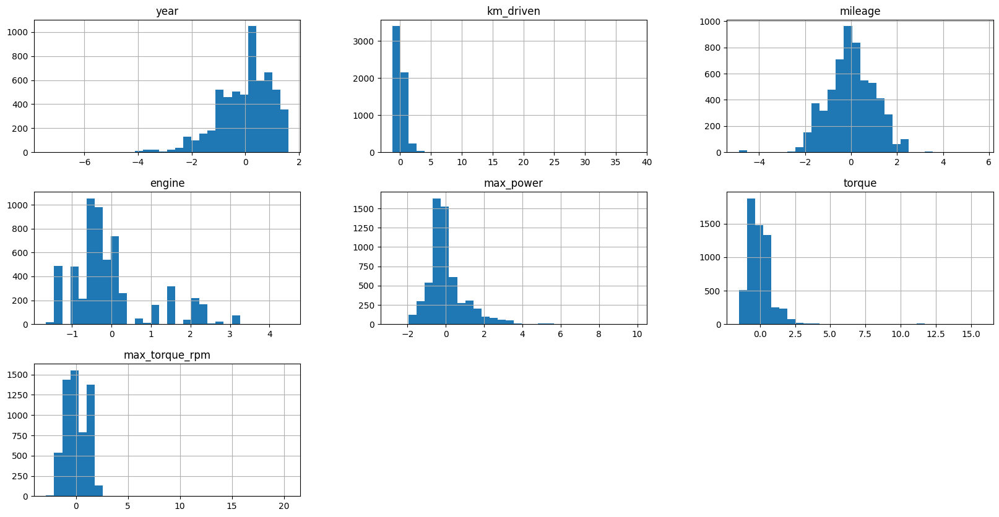

In [150]:
plt.figure(figsize=(10, 20))
X_train_ohe[num_features].hist(figsize=(20, 10), bins=30)
plt.show()

Создадим переменные логарифм от `km_driven` и `torque`. Буду брать логарифм от неотмасштабированных переменных, чтобы отрицательных чисел не было.

In [151]:
X_train_ohe['km_driven_log'] = np.log(X_train.km_driven)
X_train_ohe['torque_log'] = np.log(X_train.torque)
X_test_ohe['km_driven_log'] = np.log(X_test.km_driven)
X_test_ohe['torque_log'] = np.log(X_test.torque)

log_feature = ['km_driven_log', 'torque_log']

# А теперь отмасштабируем их
scaler = StandardScaler()
log_feat_train = scaler.fit_transform(X_train_ohe[log_feature])
lob_feat_test = scaler.transform(X_test_ohe[log_feature])

X_train_ohe[log_feature] = log_feat_train
X_test_ohe[log_feature] = lob_feat_test

Посмотрим на выбросы 

In [152]:
num_features.extend(['km_driven_inverse', 'max_power_to_engine', 'km_driven_log', 'torque_log'])

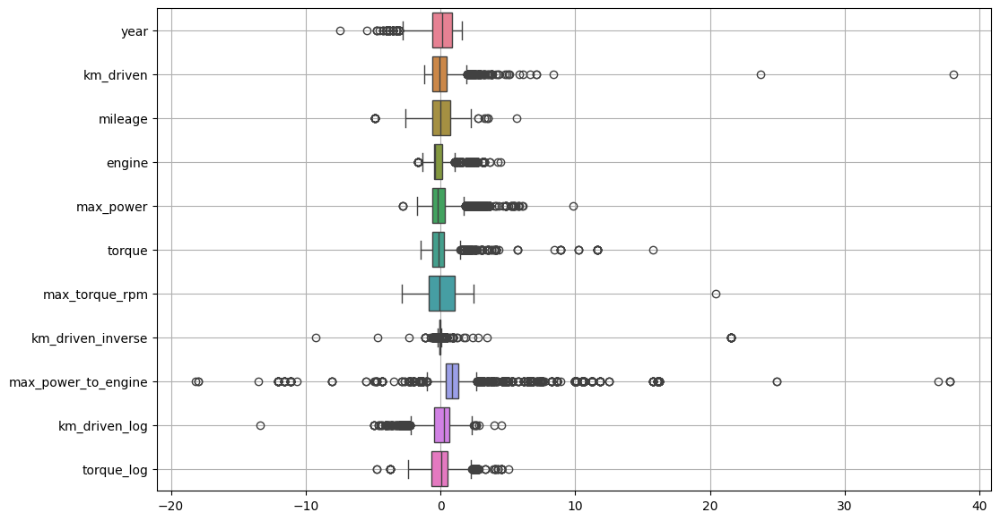

In [153]:
plt.figure(figsize=(12, 7))
sns.boxplot(data=X_train_ohe[num_features], orient='h')
plt.grid()
plt.show()

Выбросами будем считать сильные отрывы от распределений, мне такими кажутся все значения больше 20 и все значения меньше -10. Удалим их.

In [154]:
# сохраним размер до удаления
size_before = X_train_ohe.shape[0]

In [155]:
indexes = X_train_ohe[np.any((X_train_ohe[num_features] > 20) | (X_train_ohe[num_features] < -10), axis=1)].index
X_train_ohe.drop(indexes, inplace=True)
y_train.drop(indexes, inplace=True)
print(f"Потеряли {indexes.size / size_before:.2%} наблюдений")

Потеряли 1.16% наблюдений


Попробуем сформировать полиномиальные переменные с помощью `PolynomialFeatures`, и отберем наиболее важные из них с помощью Lasso.

In [156]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train_ohe)
X_test_poly = poly.transform(X_test_ohe)
poly.get_feature_names_out(input_features=X_train_ohe.columns)

lasso = Lasso(alpha=10, max_iter=1000)
lasso.fit(X_train_poly, y_train)

y_train_predict = lasso.predict(X_train_poly)
y_test_predict = lasso.predict(X_test_poly)

print(f'Train RMSE: {MSE(y_train, y_train_predict) ** 0.5}')
print(f'Test RMSE: {MSE(y_test, y_test_predict) ** 0.5}')
print(f'Train R2 score: {r2_score(y_train, y_train_predict)}')
print(f'Test R2 score: {r2_score(y_test, y_test_predict)}')

Train RMSE: 116686.09038094922
Test RMSE: 163715.80485880852
Train R2 score: 0.9525728127193662
Test R2 score: 0.9533724194846264


/home/father/Yandex.Disk/ВШЭ/ML/hw/hw1/.venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.037e+13, tolerance: 1.657e+11
  model = cd_fast.enet_coordinate_descent(


Мы видим, что качество достаточно сильно выросло, но количество признаков стало очень большим, оставим признаки с ненулевым весом.

In [157]:
X_train_poly = X_train_poly[:, (lasso.coef_ != 0)]
X_test_poly = X_test_poly[:, (lasso.coef_ != 0)]

In [158]:
X_train_poly.shape, X_test_poly.shape

((5772, 585), (1000, 585))

In [159]:
# Определение модели Ridge
ridge = Ridge()

# Определение сетки гиперпараметров для поиска
param_grid = {
    'alpha': np.logspace(-4, 1, 30),  # Параметр регуляризации
}
# Настройка GridSearchCV
grid_search = GridSearchCV(
    estimator=ridge, 
    param_grid=param_grid, 
    cv=10, 
    scoring='r2',
    verbose=1, 
    n_jobs=-1
    )

# Обучение модели
grid_search.fit(X_train_poly, y_train)

# Лучшие параметры
print("Лучшие параметры:", grid_search.best_params_)

# Оценка на тестовой выборке
best_model_engeneer = grid_search.best_estimator_

y_train_predict = best_model_engeneer.predict(X_train_poly)
y_test_predict = best_model_engeneer.predict(X_test_poly)

print(f'Train RMSE: {MSE(y_train, y_train_predict) ** 0.5}')
print(f'Test RMSE: {MSE(y_test, y_test_predict) ** 0.5}')
print(f'Train R2 score: {r2_score(y_train, y_train_predict)}')
print(f'Test R2 score: {r2_score(y_test, y_test_predict)}')

Fitting 10 folds for each of 30 candidates, totalling 300 fits
Лучшие параметры: {'alpha': np.float64(10.0)}
Train RMSE: 134655.4814159286
Test RMSE: 182863.4758894801
Train R2 score: 0.93684070622381
Test R2 score: 0.9418277841516716


Модель стала проще, количество переменных уменьшилось в два раза, но и качество немного снизилось.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [160]:
y_pred = best_model_engeneer.predict(X_test_poly)

def business_metrics(y_true, y_pred):
    return ((np.abs(y_pred / y_true - 1) <= 0.1).sum() / len(y_true)).item()

print("Доля машин прогноз цены на которые отличается менее чем на 10% от фактической цены:", end=' ')
print(f'{business_metrics(y_test, y_pred):.2%}')

Доля машин прогноз цены на которые отличается менее чем на 10% от фактической цены: 40.90%


### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [161]:
def your_business_metrics(y_true, y_pred, alpha=1):
    relative_errors = y_pred / y_true - 1
    abs_errors = np.abs(y_true - y_pred)
    return np.where(
        relative_errors > 0, 
        abs_errors, 
        np.abs(relative_errors) * alpha * abs_errors + abs_errors
    ).mean().item()

y_pred = lr.predict(X_test)
print("Линейная модель без регуляризации:")
print(f'{your_business_metrics(y_test, y_pred, alpha=5):.1f}')

y_pred = best_model_lasso.predict(X_test_scaled)
print("Lasso:")
print(f'{your_business_metrics(y_test, y_pred, alpha=5):.1f}')

y_pred = best_model_elastic_net.predict(X_test_scaled)
print("Elastic Net:")
print(f'{your_business_metrics(y_test, y_pred, alpha=5):.1f}')

y_pred = best_model_engeneer.predict(X_test_poly)
print("Final model:")
print(f'{your_business_metrics(y_test, y_pred, alpha=5):.1f}')

Линейная модель без регуляризации:
955235.0
Lasso:
955211.6
Elastic Net:
850163.8
Final model:
161156.1


Как видно наша финальная модель лучше всех решает задачу.

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 25**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

#### Создадим пайплайн нашей модели

In [162]:
from utils import NameTransformer, calc_engine_columns, calc_torque, calc_km_driven, ChoiceFeatureTransformer


engine_columns_functions = FunctionTransformer(calc_engine_columns)
torque_functions = FunctionTransformer(calc_torque)
km_driven_functions = FunctionTransformer(calc_km_driven)

engine_columns_transformer = Pipeline(
    steps=[
        ('get_engine_col', engine_columns_functions),
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),

    ])

torque_transformer = Pipeline(
    steps=[
        ('get_torque', torque_functions),
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
])

name_transformer = Pipeline(
    steps=[
        ("get_brand", NameTransformer()),
        ("one_hot_encoder", OneHotEncoder(handle_unknown='ignore', drop='first'))
    ])

km_driven_transformer = Pipeline(
    steps=[
        ('get_km_driven', km_driven_functions),
        ('scaler', StandardScaler()),
    ])

data_transformer = ColumnTransformer(transformers=[
    ("get_engine_col", engine_columns_transformer, ['mileage', 'max_power', 'engine']),
    ("get_toque_col", torque_transformer, ['torque']),
    ("get_brand", name_transformer, ['name']),
    ("get_km_driven", km_driven_transformer, ['km_driven']),
    (
        "one_hot_encoder", 
        OneHotEncoder(handle_unknown='ignore', drop='first'), 
        ['fuel', 'seller_type', 'transmission', 'owner', 'seats']
    ),
    ('scaler', StandardScaler(), ['year'])
])

preprocessor = Pipeline(steps=[
    ("data_transformer", data_transformer),
    ("polynomial_features", PolynomialFeatures(degree=2)),
    ("choice_feature", ChoiceFeatureTransformer()),
    ])

pipeline = Pipeline(
    steps=[("preprocessor", preprocessor),
           ("ridge", Ridge(alpha=10))
           ])

Загрузим данные заново, чтобы они были такие которые к нам приходят.

In [163]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

Выделим таргет и матрицу признаков.

In [164]:
X_train = df_train.drop(target, axis=1)
y_train = df_train[target]

X_test = df_test.drop(target, axis=1)
y_test = df_test[target]

Обучим пайплайн на тренировочном множестве.

In [165]:
pipeline.fit(X_train, y_train)

Значение - bhp заменено на NaN


/home/father/Yandex.Disk/ВШЭ/ML/hw/hw1/.venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.913e+13, tolerance: 4.579e+11
  model = cd_fast.enet_coordinate_descent(


Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('get_engine_col',
                                                                   Pipeline(steps=[('get_engine_col',
                                                                                    FunctionTransformer(func=<function calc_engine_columns at 0x7e628828e3b0>)),
                                                                                   ('imputer',
                                                                                    SimpleImputer(strategy='median')),
                                                                                   ('scaler',
                                                                                    StandardScaler())]),
                                                                   ['mileage',
                                                                    'max_power',
                                                                    'engine']),
                                                                  ('get_toque_col'...
                                                                                    FunctionTransformer(func=<function calc_km_driven at 0x7e628828f2e0>)),
                                                                                   ('scaler',
                                                                                    StandardScaler())]),
                                                                   ['km_driven']),
                                                                  ('one_hot_encoder',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'),
                                                                   ['fuel',
                                                                    'seller_type',
                                                                    'transmission',
                                                                    'owner',
                                                                    'seats']),
                                                                  ('scaler',
                                                                   StandardScaler(),
                                                                   ['year'])])),
                                 ('polynomial_features', PolynomialFeatures()),
                                 ('choice_feature',
                                  ChoiceFeatureTransformer())])),
                ('ridge', Ridge(alpha=10))])

Проверим качество на тестовом множестве

In [166]:
y_train_predict = pipeline.predict(X_train)
y_test_predict = pipeline.predict(X_test)

print(f'Train RMSE: {MSE(y_train, y_train_predict) ** 0.5}')
print(f'Test RMSE: {MSE(y_test, y_test_predict) ** 0.5}')
print(f'Train R2 score: {r2_score(y_train, y_train_predict)}')
print(f'Test R2 score: {r2_score(y_test, y_test_predict)}')

Значение - bhp заменено на NaN
Train RMSE: 132215.6994900576
Test RMSE: 141586.2663044953
Train R2 score: 0.9732826465997382
Test R2 score: 0.9651258264583216


/home/father/Yandex.Disk/ВШЭ/ML/hw/hw1/.venv/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:242: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


Сохраним нашу модель

In [167]:
with open("model.pkl", "wb") as f:
    pickle.dump(pipeline, f)

Реализация сервиса находится в файлу `service.py`

In [168]:
import pickle

from fastapi import FastAPI
from pydantic import BaseModel
from typing import List
import pandas as pd


with open("model.pkl", "rb") as f:
    model = pickle.load(f)

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    item_dict = item.model_dump()
    for key, value in item_dict.items():
        item_dict[key] = [value]

    df = pd.DataFrame.from_dict(item_dict)
    pred = model.predict(df)

    return pred.round(2)


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    item_dict = {}
    item = items[0]
    for key, value in item.model_dump().items():
        item_dict[key] = [value]

    for item in items[1:]:
        for key, value in item.model_dump().items():
            item_dict[key].append(value)

    df = pd.DataFrame.from_dict(item_dict)
    pred = model.predict(df)

    return pred.round(2).tolist()

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 26**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией

3. Просматривает ноутбук с DS частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/Kz1ZRWj)

</details>

Мне кажется этот кот Романа.